In [53]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt


In [54]:
local='D://job//FPT.csv'
df_raw=pd.read_csv(local)
df_raw.head()


,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,12/25/2018 9:15,30.89,30.89,30.89,30.89,35410,0
1,FPT,12/25/2018 9:16,30.81,30.81,30.81,30.81,190,0
2,FPT,12/25/2018 9:17,30.74,30.81,30.74,30.74,1120,0
3,FPT,12/25/2018 9:18,30.74,30.74,30.74,30.74,2120,0
4,FPT,12/25/2018 9:19,30.74,30.74,30.74,30.74,22500,0


In [55]:
df_train=df_raw.iloc[:,2:5]
df_test=df_raw.iloc[:,5]

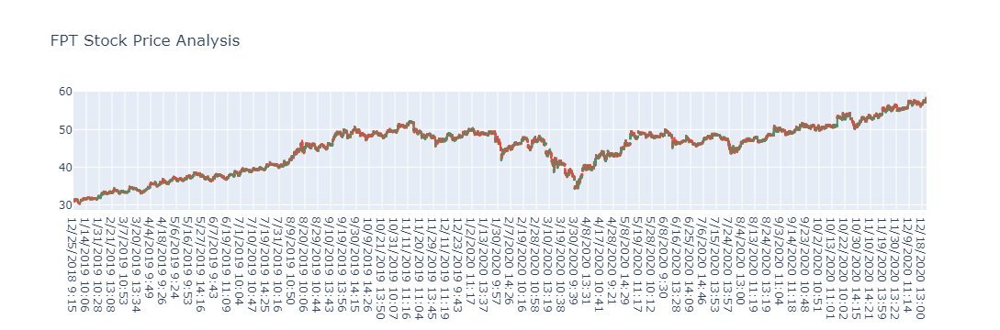

In [56]:
path = Path(local)
file_name = path.stem

figure = go.Figure(data=[go.Candlestick(x=df_raw["Date/Time"],
                                        open=df_raw["Open"], high=df_raw["High"],
                                        low=df_raw["Low"], close=df_raw["Close"])])
figure.update_layout(title = file_name+" Stock Price Analysis", xaxis_rangeslider_visible=False)
figure.show()

In [65]:
# Chuyển đổi cột 'date' thành datetime
df_raw['Date/Time'] = pd.to_datetime(df_raw['Date/Time'])

# Tạo cột 'month_day' chỉ chứa tháng và ngày
df_raw['year-month-day'] = df_raw['Date/Time'].dt.strftime('%Y-%m-%d')

In [66]:
df_raw.head()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest,year-month-day
0,FPT,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,0,2018-12-25
1,FPT,2018-12-25 09:16:00,30.81,30.81,30.81,30.81,190,0,2018-12-25
2,FPT,2018-12-25 09:17:00,30.74,30.81,30.74,30.74,1120,0,2018-12-25
3,FPT,2018-12-25 09:18:00,30.74,30.74,30.74,30.74,2120,0,2018-12-25
4,FPT,2018-12-25 09:19:00,30.74,30.74,30.74,30.74,22500,0,2018-12-25


In [67]:
average_values = df_raw.groupby('year-month-day')[['Open', 'High', 'Low','Close']].mean().reset_index()


In [68]:
df_raw.head(8)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest,year-month-day
0,FPT,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,0,2018-12-25
1,FPT,2018-12-25 09:16:00,30.81,30.81,30.81,30.81,190,0,2018-12-25
2,FPT,2018-12-25 09:17:00,30.74,30.81,30.74,30.74,1120,0,2018-12-25
3,FPT,2018-12-25 09:18:00,30.74,30.74,30.74,30.74,2120,0,2018-12-25
4,FPT,2018-12-25 09:19:00,30.74,30.74,30.74,30.74,22500,0,2018-12-25
5,FPT,2018-12-25 09:20:00,30.74,30.74,30.70,30.74,7140,0,2018-12-25
6,FPT,2018-12-25 09:21:00,30.66,30.74,30.59,30.66,16480,0,2018-12-25
7,FPT,2018-12-26 09:15:00,31.04,31.11,31.04,31.11,2650,0,2018-12-26


In [69]:
average_values.head()

,year-month-day,Open,High,Low,Close
0,2018-12-25,30.760000,30.781429,30.744286,30.760000
1,2018-12-26,31.048016,31.054683,31.042857,31.050159
2,2018-12-27,31.332537,31.335821,31.327313,31.331567
3,2018-12-28,31.322213,31.326803,31.318525,31.321557
4,2019-01-02,31.231709,31.238376,31.224188,31.232393


In [70]:
dataset = average_values.drop(columns=['year-month-day']).to_numpy()
print(dataset.shape)

(499, 4)


           Open      High       Low     Close
Open   1.000000  0.999999  0.999999  1.000000
High   0.999999  1.000000  0.999998  0.999999
Low    0.999999  0.999998  1.000000  0.999999
Close  1.000000  0.999999  0.999999  1.000000


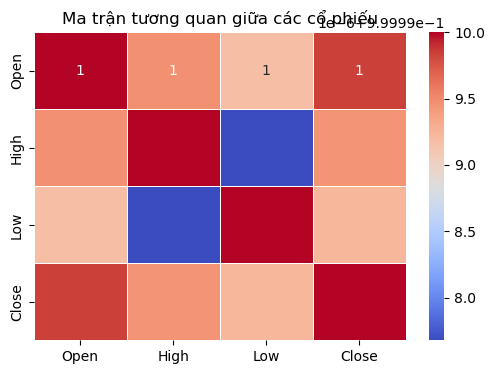

In [63]:
# Tính toán ma trận tương quan
correlation_matrix = average_values.drop(columns=['year-month-day']).corr()

# In ma trận tương quan
print(correlation_matrix)

# Vẽ ma trận tương quan
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Ma trận tương quan giữa các cổ phiếu')
plt.show()


In [64]:
dt_Train,dt_Test = train_test_split(dataset,test_size=0.2,shuffle=False)

In [41]:
print('số lượng mẫu cho tập train: {}'.format(dt_Train.size))
print('số lượng mẫu cho tập train: {}'.format(dt_Test.size))

số lượng mẫu cho tập train: 1596
số lượng mẫu cho tập train: 400


In [42]:
### multivariate lstm model


In [43]:
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [44]:
# choose a number of time steps
n_steps = 3
# convert into input/output
X, y = split_sequences(dt_Train, n_steps)
print('chọn timesteps là 3 nên số mẫu dữ liệu train được đưa vào mô hình có dạng:')
print('mẫu                  : {} lần lượt là (số lượng mẫu, n_steps, 3 features open, high, low)'.format(X.shape))
print('giá cổ phếu cuối cùng: {}'.format(y.shape))

chọn timesteps là 3 nên số mẫu dữ liệu train được đưa vào mô hình có dạng:
mẫu                  : (397, 3, 3) lần lượt là (số lượng mẫu, n_steps, 3 features open, high, low)
giá cổ phếu cuối cùng: (397,)


In [45]:
# define model
n_features=X.shape[1]
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(X, y, epochs=200, verbose=0)

D:\code\anaconda4-22-2024\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [46]:
y_val=[]
X_val, y_target = split_sequences(dt_Test, n_steps)

for step in X_val:
    x_input = step.reshape((1, n_steps, n_features))
    y_hat = model.predict(x_input, verbose=0)
    y_val.append(y_hat.flatten()[0])
print("giá trị dự đoán: ")
print(y_val)

[46.97654, 47.196033, 47.421974, 47.1192, 47.07871, 47.786186, 47.979065, 46.750156, 46.921818, 46.89575, 47.12289, 47.35968, 48.228966, 48.790165, 48.58629, 48.61975, 50.5302, 49.78211, 49.77369, 50.109047, 49.776173, 49.60563, 48.798462, 48.87684, 49.41614, 49.02407, 49.24481, 49.77212, 50.441303, 50.165703, 50.97513, 51.465515, 50.999557, 51.10883, 50.716618, 50.423393, 50.854603, 50.979996, 49.95172, 50.44143, 50.47006, 50.2637, 50.551212, 50.44912, 50.887306, 50.96383, 50.931152, 50.67815, 50.87263, 50.96791, 52.53566, 53.35023, 52.907482, 53.70603, 53.110825, 53.985455, 53.958427, 52.654377, 51.564472, 50.400715, 50.8905, 51.422646, 52.12589, 52.996567, 52.94437, 52.293533, 53.095055, 53.614357, 52.95454, 52.9648, 53.619648, 53.88939, 53.36483, 53.922653, 54.88148, 55.366875, 55.114655, 55.802002, 55.70148, 55.28513, 55.861504, 56.32584, 55.010487, 55.273933, 55.40741, 55.507965, 55.662792, 55.703056, 57.204933, 57.317654, 56.570297, 57.30163, 57.193657, 57.09468, 56.55724, 56.68

(98,)
98


In [48]:
print("----Linear Regression----")
print("MAE: %.5f" %mae(y_val,y_target))
print("MSE: %.5f" %mse(y_val,y_target))
print("NSE: %.5f" %(1-(np.sum((y_target-y_val)**2)/np.sum((y_target-np.mean(y_target))**2))))
print("R2: %.5f \n" %r2_score(y_target,y_val))

----Linear Regression----
MAE: 0.04365
MSE: 0.00464
NSE: 0.99950
R2: 0.99950 



In [49]:
time=average_values['year-month-day'].iloc[-len(y_val):]
print(time.shape)
print(y_target.shape)
print(len(y_val))

(98,)
(98,)
98


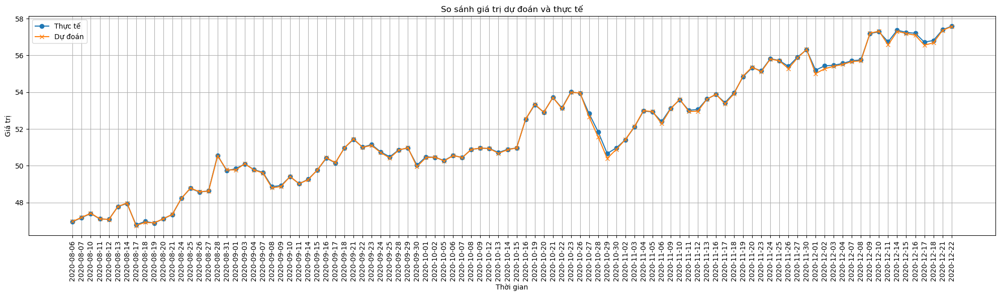

In [50]:
plt.figure(figsize=(20, 6))
plt.plot(time, y_target, label='Thực tế', marker='o')
plt.plot(time, y_val, label='Dự đoán', marker='x')
plt.xlabel('Thời gian')
plt.ylabel('Giá trị')
plt.title('So sánh giá trị dự đoán và thực tế')
plt.xticks(rotation=90)  # Xoay nhãn trục x để dễ đọc
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [51]:
price_vol=[]
for i in range(1,len(y_val)):
    price_vol.append(y_val[i]-y_val[i-1])


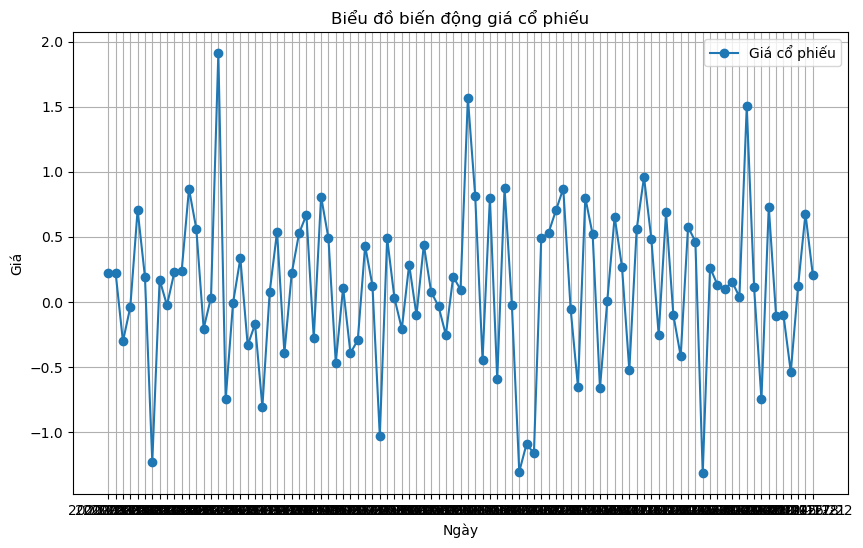

In [52]:
# Vẽ biểu đồ đường
plt.figure(figsize=(10, 6))
plt.plot(time[1:], price_vol, label='Giá cổ phiếu', linestyle='-', marker='o')

# Thêm tiêu đề và nhãn trục
plt.title('Biểu đồ biến động giá cổ phiếu')
plt.xlabel('Ngày')
plt.ylabel('Giá')
plt.legend()
plt.grid(True)

NameError: name 'model' is not defined